In [1]:
import matplotlib.pyplot as plt
import os
import pandas as pd

In [3]:
data='/Users/sonu/Downloads/archive (1)/train'
val_path='/Users/sonu/Downloads/archive (1)/valid'

In [30]:
#@title Creating Training DataFrame
def create_df(path):
  data=[]
  for folder in os.listdir(path):
    for file in os.listdir(os.path.join(path,folder)):
     data.append(['/Users/sonu/Downloads/archive (1)/train/' + folder + '/' + file, folder.split('-')[-1]])
  return pd.DataFrame(data,columns=['filename','label'])

In [31]:
df=create_df(data)

In [32]:
df

,filename,label
0,/Users/sonu/Downloads/archive (1)/train/Late_b...,Late_blight
1,/Users/sonu/Downloads/archive (1)/train/Late_b...,Late_blight
2,/Users/sonu/Downloads/archive (1)/train/Late_b...,Late_blight
3,/Users/sonu/Downloads/archive (1)/train/Late_b...,Late_blight
4,/Users/sonu/Downloads/archive (1)/train/Late_b...,Late_blight
...,...,...
25846,/Users/sonu/Downloads/archive (1)/train/Spider...,spotted_spider_mite
25847,/Users/sonu/Downloads/archive (1)/train/Spider...,spotted_spider_mite
25848,/Users/sonu/Downloads/archive (1)/train/Spider...,spotted_spider_mite
25849,/Users/sonu/Downloads/archive (1)/train/Spider...,spotted_spider_mite


In [33]:
df['label'].value_counts()

label
Late_blight                      3113
healthy                          3051
Septoria_leaf_spot               2882
Bacterial_spot                   2826
Leaf_Mold                        2754
Early_blight                     2455
Tomato_mosaic_virus              2153
Tomato_Yellow_Leaf_Curl_Virus    2039
Target_Spot                      1827
spotted_spider_mite              1747
powdery_mildew                   1004
Name: count, dtype: int64

In [34]:
#@title Creating Validation DataFrame
def create_validation_df(path):
  validation_data=[]
  for folder in os.listdir(path):
    for file in os.listdir(os.path.join(path,folder)):
      validation_data.append(['/Users/sonu/Downloads/archive (1)/valid/' + folder + '/'+file,folder.split('-')[-1]])
  return pd.DataFrame(validation_data,columns=['filename','label'])

In [35]:
val_df=create_validation_df(val_path)

In [36]:
val_df

,filename,label
0,/Users/sonu/Downloads/archive (1)/valid/Late_b...,Late_blight
1,/Users/sonu/Downloads/archive (1)/valid/Late_b...,Late_blight
2,/Users/sonu/Downloads/archive (1)/valid/Late_b...,Late_blight
3,/Users/sonu/Downloads/archive (1)/valid/Late_b...,Late_blight
4,/Users/sonu/Downloads/archive (1)/valid/Late_b...,Late_blight
...,...,...
6678,/Users/sonu/Downloads/archive (1)/valid/Spider...,spotted_spider_mite
6679,/Users/sonu/Downloads/archive (1)/valid/Spider...,spotted_spider_mite
6680,/Users/sonu/Downloads/archive (1)/valid/Spider...,spotted_spider_mite
6681,/Users/sonu/Downloads/archive (1)/valid/Spider...,spotted_spider_mite


In [37]:
import cv2

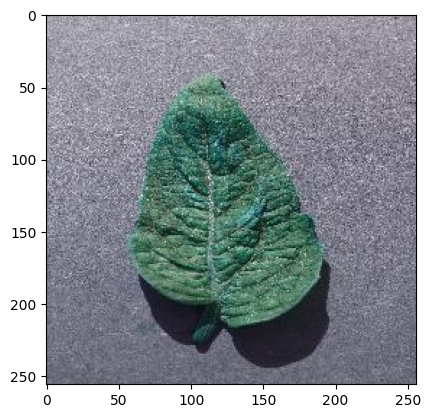

In [38]:
image =cv2.imread(val_df['filename'][6680])
plt.imshow(image)

In [39]:
val_df['label'].value_counts()

label
healthy                          805
Late_blight                      792
Septoria_leaf_spot               746
Leaf_Mold                        739
Bacterial_spot                   732
Early_blight                     643
Tomato_mosaic_virus              584
Tomato_Yellow_Leaf_Curl_Virus    498
Target_Spot                      457
spotted_spider_mite              435
powdery_mildew                   252
Name: count, dtype: int64

<Axes: xlabel='label'>

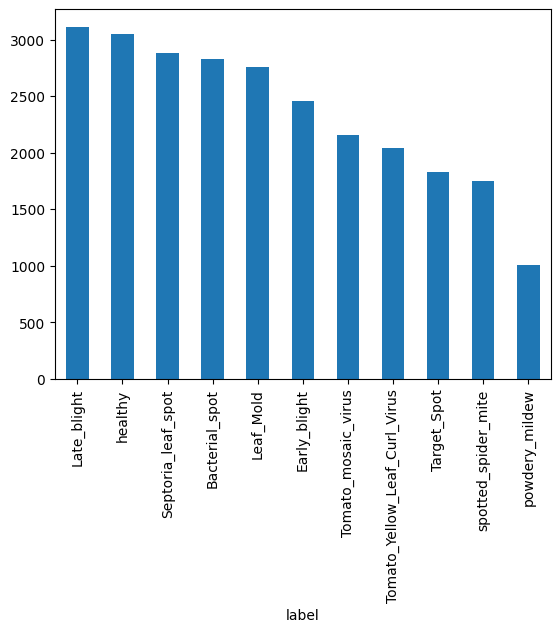

In [40]:
labels_distribution=df['label'].value_counts()
labels_distribution.plot(kind='bar')

<Axes: xlabel='label'>

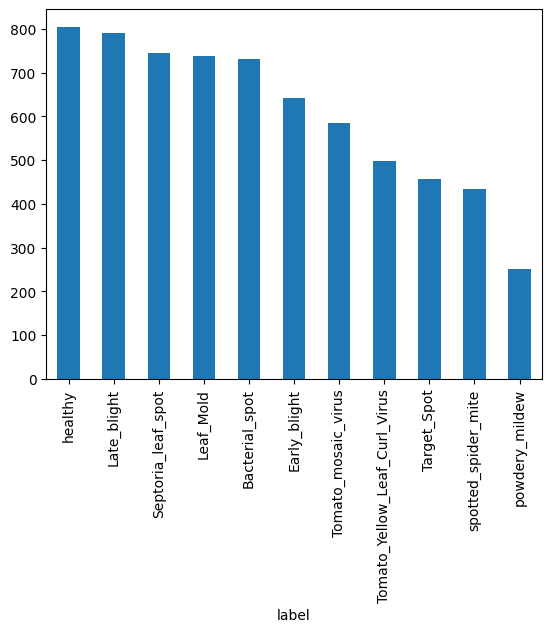

In [41]:
#@title Visualise the Labels distribution of Validation data

labels_distribution=val_df['label'].value_counts()
labels_distribution.plot(kind='bar')

In [42]:
import plotly.express as px
plt.figure(figsize=(15, 10))
px.pie(df, names='label',title="Disease Distribution",  color_discrete_sequence=["#ff7740","#4ec200","#0084c2"])

<Figure size 1500x1000 with 0 Axes>

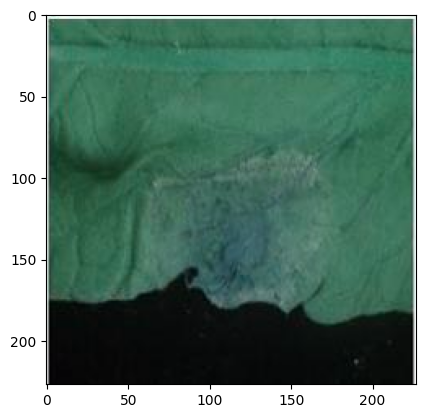

In [43]:
image =cv2.imread(df['filename'][0])
plt.imshow(image)

In [44]:
image.shape

(227, 227, 3)

In [45]:
from sklearn.model_selection import train_test_split

X = df['filename']
y = df['label']

X_train, X_test, y_train,y_test=train_test_split(X, y, test_size=0.2, random_state=42)


In [46]:
X_train

24623    /Users/sonu/Downloads/archive (1)/train/Spider...
21324    /Users/sonu/Downloads/archive (1)/train/Bacter...
12767    /Users/sonu/Downloads/archive (1)/train/Early_...
4447     /Users/sonu/Downloads/archive (1)/train/Septor...
24550    /Users/sonu/Downloads/archive (1)/train/Spider...
                               ...                        
21575    /Users/sonu/Downloads/archive (1)/train/Bacter...
5390     /Users/sonu/Downloads/archive (1)/train/Septor...
860      /Users/sonu/Downloads/archive (1)/train/Late_b...
15795    /Users/sonu/Downloads/archive (1)/train/Target...
23654    /Users/sonu/Downloads/archive (1)/train/Bacter...
Name: filename, Length: 20680, dtype: object

In [47]:
train_df = pd.DataFrame(X_train)
train_df['label'] = y_train

In [48]:
train_df

,filename,label
24623,/Users/sonu/Downloads/archive (1)/train/Spider...,spotted_spider_mite
21324,/Users/sonu/Downloads/archive (1)/train/Bacter...,Bacterial_spot
12767,/Users/sonu/Downloads/archive (1)/train/Early_...,Early_blight
4447,/Users/sonu/Downloads/archive (1)/train/Septor...,Septoria_leaf_spot
24550,/Users/sonu/Downloads/archive (1)/train/Spider...,spotted_spider_mite
...,...,...
21575,/Users/sonu/Downloads/archive (1)/train/Bacter...,Bacterial_spot
5390,/Users/sonu/Downloads/archive (1)/train/Septor...,Septoria_leaf_spot
860,/Users/sonu/Downloads/archive (1)/train/Late_b...,Late_blight
15795,/Users/sonu/Downloads/archive (1)/train/Target...,Target_Spot


In [49]:
test_df=pd.DataFrame(X_test)
test_df['label']=y_test

In [50]:
test_df

,filename,label
22325,/Users/sonu/Downloads/archive (1)/train/Bacter...,Bacterial_spot
341,/Users/sonu/Downloads/archive (1)/train/Late_b...,Late_blight
1510,/Users/sonu/Downloads/archive (1)/train/Late_b...,Late_blight
2201,/Users/sonu/Downloads/archive (1)/train/Late_b...,Late_blight
24731,/Users/sonu/Downloads/archive (1)/train/Spider...,spotted_spider_mite
...,...,...
23608,/Users/sonu/Downloads/archive (1)/train/Bacter...,Bacterial_spot
5198,/Users/sonu/Downloads/archive (1)/train/Septor...,Septoria_leaf_spot
2405,/Users/sonu/Downloads/archive (1)/train/Late_b...,Late_blight
17756,/Users/sonu/Downloads/archive (1)/train/Leaf_M...,Leaf_Mold


In [51]:
IMG_SIZE=256
BATCH_SIZE=32
Epochs=50

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [55]:
train_datagen = ImageDataGenerator(rescale=1/255.)
test_datagen = ImageDataGenerator(rescale=1/255.)
val_datagen  = ImageDataGenerator(rescale=1/255.)

In [56]:
# Create data generators from dataframes
train_generator = train_datagen.flow_from_dataframe(
    dataframe=train_df,
    x_col="filename",
    y_col="label",
    target_size=(IMG_SIZE, IMG_SIZE),
    class_mode="categorical",
    batch_size=BATCH_SIZE
)

Found 20680 validated image filenames belonging to 11 classes.


In [57]:
val_generator = val_datagen.flow_from_dataframe(
    dataframe=val_df,
    x_col="filename",
    y_col="label",
    target_size=(IMG_SIZE, IMG_SIZE),
    class_mode="categorical",
    batch_size=BATCH_SIZE,
)

test_generator = test_datagen.flow_from_dataframe(
    dataframe=test_df,
    x_col="filename",
    y_col="label",
    target_size=(IMG_SIZE, IMG_SIZE),
    class_mode="categorical",
    batch_size=BATCH_SIZE,
)

print(train_generator.class_indices)
print(val_generator.class_indices)
print(test_generator.class_indices)

Found 6683 validated image filenames belonging to 11 classes.
Found 5171 validated image filenames belonging to 11 classes.
{'Bacterial_spot': 0, 'Early_blight': 1, 'Late_blight': 2, 'Leaf_Mold': 3, 'Septoria_leaf_spot': 4, 'Target_Spot': 5, 'Tomato_Yellow_Leaf_Curl_Virus': 6, 'Tomato_mosaic_virus': 7, 'healthy': 8, 'powdery_mildew': 9, 'spotted_spider_mite': 10}
{'Bacterial_spot': 0, 'Early_blight': 1, 'Late_blight': 2, 'Leaf_Mold': 3, 'Septoria_leaf_spot': 4, 'Target_Spot': 5, 'Tomato_Yellow_Leaf_Curl_Virus': 6, 'Tomato_mosaic_virus': 7, 'healthy': 8, 'powdery_mildew': 9, 'spotted_spider_mite': 10}
{'Bacterial_spot': 0, 'Early_blight': 1, 'Late_blight': 2, 'Leaf_Mold': 3, 'Septoria_leaf_spot': 4, 'Target_Spot': 5, 'Tomato_Yellow_Leaf_Curl_Virus': 6, 'Tomato_mosaic_virus': 7, 'healthy': 8, 'powdery_mildew': 9, 'spotted_spider_mite': 10}


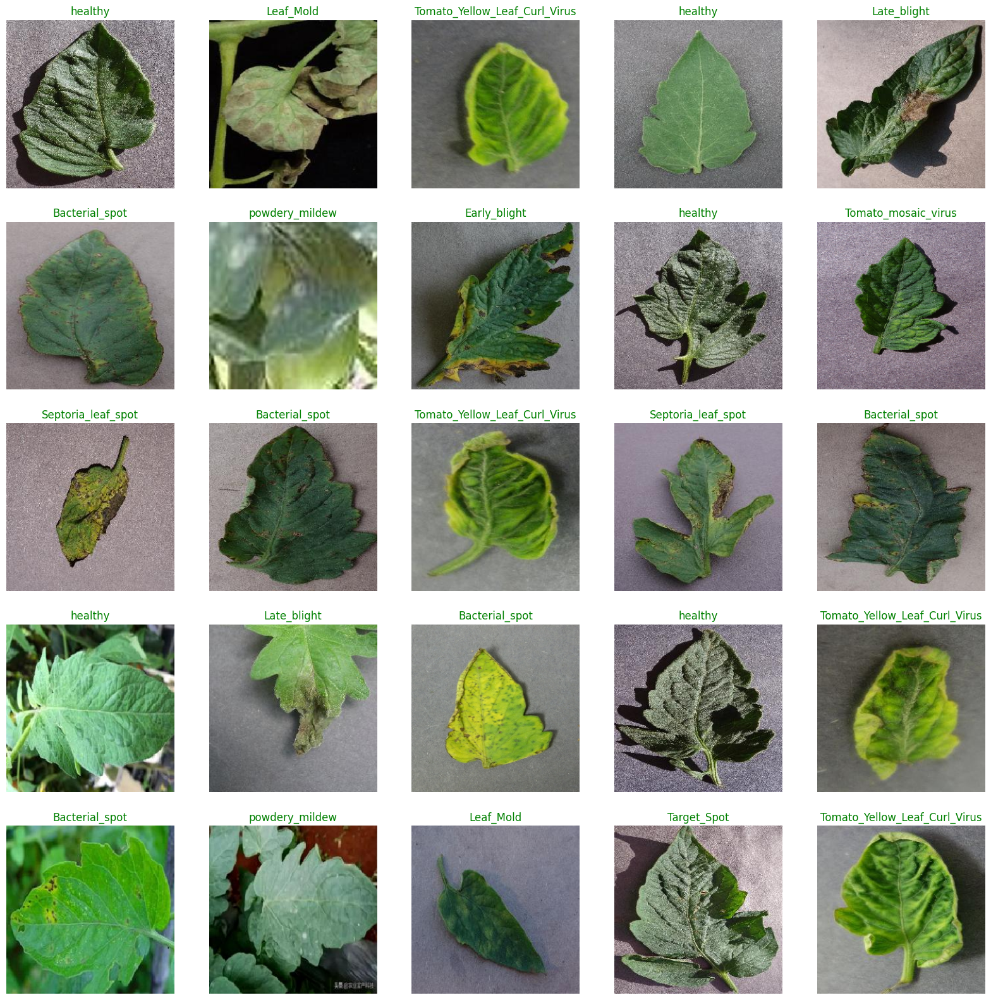

In [58]:
import matplotlib.pyplot as plt
import numpy as np

def show_images(image_gen):
    class_dict = image_gen.class_indices
    classes = list(class_dict.keys())
    images, labels = next(image_gen)
    plt.figure(figsize=(20, 20))
    num_images = min(len(labels), 25)
    
    for i in range(num_images):
        plt.subplot(5, 5, i + 1)
        image = images[i]
        plt.imshow(image)
        index = np.argmax(labels[i])
        class_name = classes[index]
        plt.title(class_name, color="green", fontsize=12)
        plt.axis('off')
    plt.show()
show_images(train_generator)

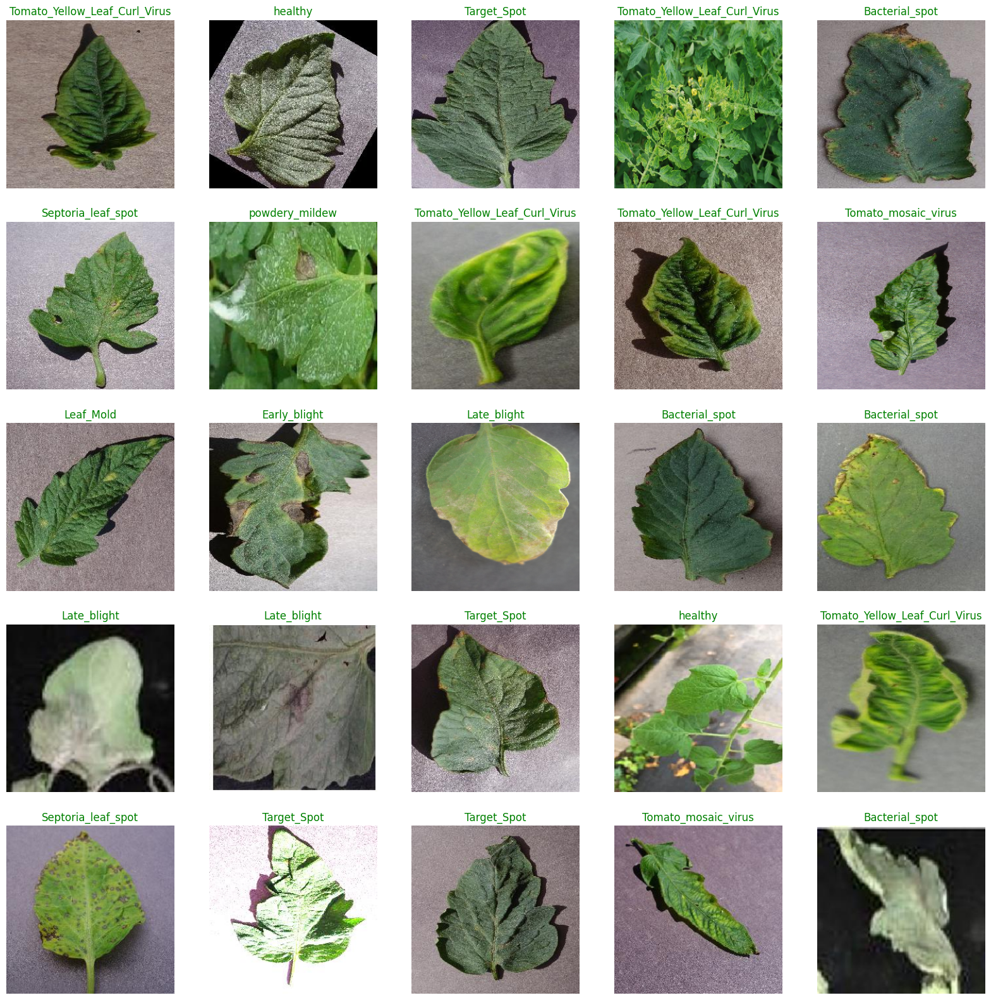

In [59]:
show_images(val_generator)

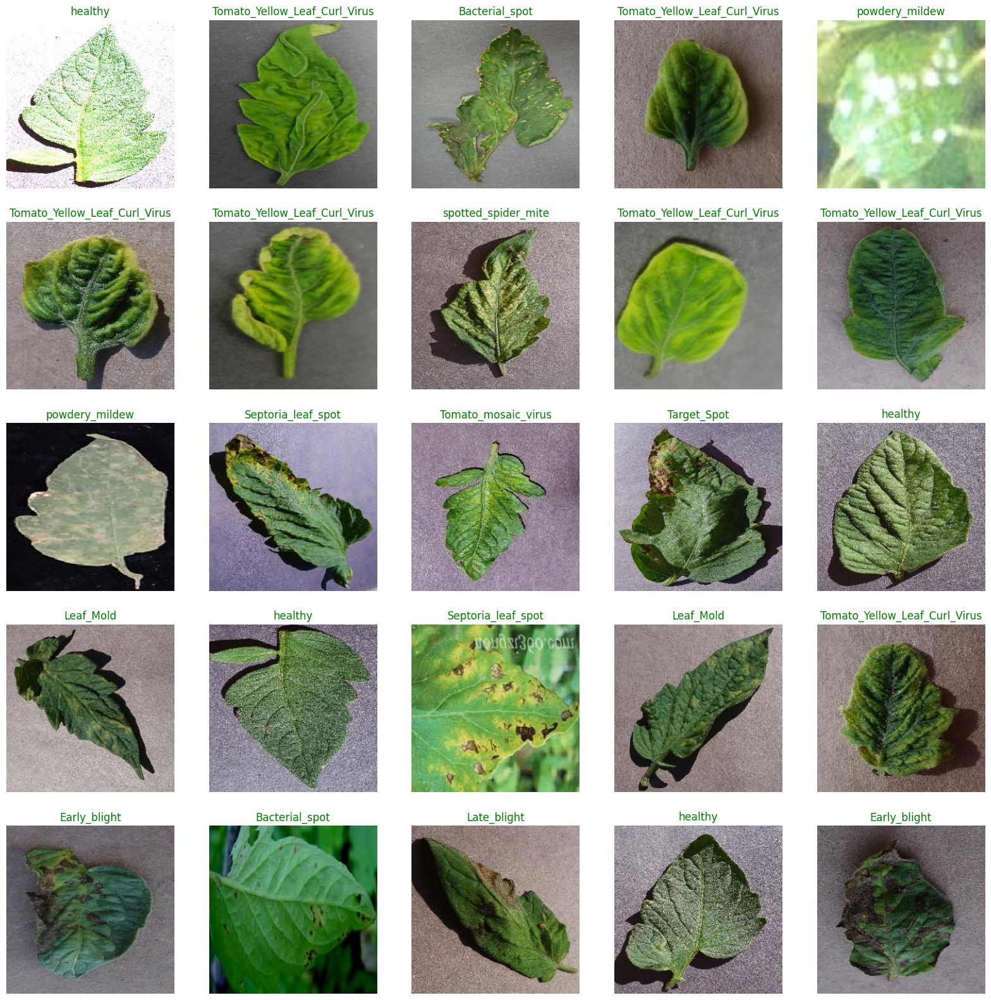

In [60]:
show_images(test_generator)

In [61]:
NUM_CLASSES = 11

In [62]:
from tensorflow.keras import layers, models
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.optimizers import Adamax

IMG_SIZE = 256
NUM_CLASSES = 11

# Define input as 1-channel (to satisfy your current TF/Keras bugged EfficientNet)
inputs = layers.Input(shape=(IMG_SIZE, IMG_SIZE, 1))

# Repeat the single channel 3 times → RGB
x = layers.Concatenate()([inputs, inputs, inputs])

# Pass into EfficientNetB0 (now sees 3 channels, matching pretrained weights)
base_model = EfficientNetB0(
    weights=None,
    include_top=False,
    input_tensor=x,
    pooling="max"
)

y = base_model.output
y = layers.BatchNormalization()(y)
y = layers.Dense(128, activation="relu")(y)
y = layers.Dropout(0.45)(y)
outputs = layers.Dense(NUM_CLASSES, activation="softmax")(y)

model = models.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer=Adamax(learning_rate=0.001),
              loss="categorical_crossentropy",
              metrics=["accuracy"])

print(model.input_shape)

(None, 256, 256, 1)


In [63]:
import tensorflow as tf
print("TF version:", tf.__version__)

TF version: 2.20.0-rc0


In [64]:
import tensorflow as tf
from tensorflow.keras import models, layers
from tensorflow import keras

# Transfer Learning

## EfficientNet

In [65]:
images, labels = next(train_generator)
print("Image batch shape:", images.shape)   # should be (batch_size, 256, 256, 3)

Image batch shape: (32, 256, 256, 3)


In [66]:
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.layers import BatchNormalization, Dense, Dropout
from tensorflow.keras.optimizers import Adamax
from tensorflow.keras.models import Model

In [67]:
base_model = EfficientNetB0(
    weights=None,
    include_top=False,
    input_shape=(IMG_SIZE, IMG_SIZE, 3),  # ✅ must be 3 channels
    pooling="max"
)
x = base_model.output
x = BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001)(x)
x = Dense(128, activation='relu')(x)
x = Dropout(0.45)(x)
predictions = Dense(11, activation='softmax')(x)
model = Model(inputs=base_model.input, outputs=predictions)

optimizer = Adamax(learning_rate=0.001)
model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

In [137]:
history1=model.fit(
    train_generator,
    epochs=20,
    validation_data=val_generator
)

Epoch 1/20


/opt/homebrew/Caskroom/miniconda/base/lib/python3.13/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning:

Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.



647/647 ━━━━━━━━━━━━━━━━━━━━ 1863s 3s/step - accuracy: 0.1955 - loss: 2.2987 - val_accuracy: 0.1155 - val_loss: 2.6812
Epoch 2/20
647/647 ━━━━━━━━━━━━━━━━━━━━ 2042s 3s/step - accuracy: 0.3984 - loss: 1.6928 - val_accuracy: 0.5195 - val_loss: 1.3421
Epoch 3/20
647/647 ━━━━━━━━━━━━━━━━━━━━ 3652s 6s/step - accuracy: 0.5589 - loss: 1.2583 - val_accuracy: 0.5896 - val_loss: 1.1305
Epoch 4/20
647/647 ━━━━━━━━━━━━━━━━━━━━ 3355s 5s/step - accuracy: 0.6526 - loss: 1.0053 - val_accuracy: 0.7386 - val_loss: 0.7901
Epoch 5/20
647/647 ━━━━━━━━━━━━━━━━━━━━ 2847s 4s/step - accuracy: 0.7098 - loss: 0.8478 - val_accuracy: 0.7666 - val_loss: 0.6763
Epoch 6/20
647/647 ━━━━━━━━━━━━━━━━━━━━ 3471s 5s/step - accuracy: 0.7505 - loss: 0.7316 - val_accuracy: 0.8079 - val_loss: 0.5775
Epoch 7/20
647/647 ━━━━━━━━━━━━━━━━━━━━ 2843s 4s/step - accuracy: 0.7790 - loss: 0.6428 - val_accuracy: 0.8013 - val_loss: 0.6095
Epoch 8/20
647/647 ━━━━━━━━━━━━━━━━━━━━ 1963s 3s/step - accuracy: 0.8090 - loss: 0.5649 - val_accurac

In [68]:
print("Train DF length:", len(train_df))
print("Val DF length:", len(val_df))
print("Test DF length:", len(test_df))

print(train_df.head())

print("Train generator samples:", train_generator.samples)
print("Val generator samples:", val_generator.samples)
print("Test generator samples:", test_generator.samples)

Train DF length: 20680
Val DF length: 6683
Test DF length: 5171
                                                filename                label
24623  /Users/sonu/Downloads/archive (1)/train/Spider...  spotted_spider_mite
21324  /Users/sonu/Downloads/archive (1)/train/Bacter...       Bacterial_spot
12767  /Users/sonu/Downloads/archive (1)/train/Early_...         Early_blight
4447   /Users/sonu/Downloads/archive (1)/train/Septor...   Septoria_leaf_spot
24550  /Users/sonu/Downloads/archive (1)/train/Spider...  spotted_spider_mite
Train generator samples: 20680
Val generator samples: 6683
Test generator samples: 5171


In [139]:
train_loss,train_acc=model.evaluate(train_generator)

647/647 ━━━━━━━━━━━━━━━━━━━━ 554s 856ms/step - accuracy: 0.9463 - loss: 0.2732


In [140]:
print('Training Accuracy: {:.2f}%'.format(train_acc * 100))
print('Training Loss: {:.2f}'.format(train_loss*100))

Training Accuracy: 94.63%
Training Loss: 27.32


In [141]:
val,acc=model.evaluate(test_generator)
print('Test Accuracy: {:.2f}%'.format(acc * 100))
print('Test Loss: {:.2f}%'.format(val*100))

/opt/homebrew/Caskroom/miniconda/base/lib/python3.13/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning:

Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.



162/162 ━━━━━━━━━━━━━━━━━━━━ 139s 858ms/step - accuracy: 0.8192 - loss: 0.7744
Test Accuracy: 81.92%
Test Loss: 77.44%


In [143]:
pip install seaborn

Note: you may need to restart the kernel to use updated packages.


162/162 ━━━━━━━━━━━━━━━━━━━━ 150s 928ms/step


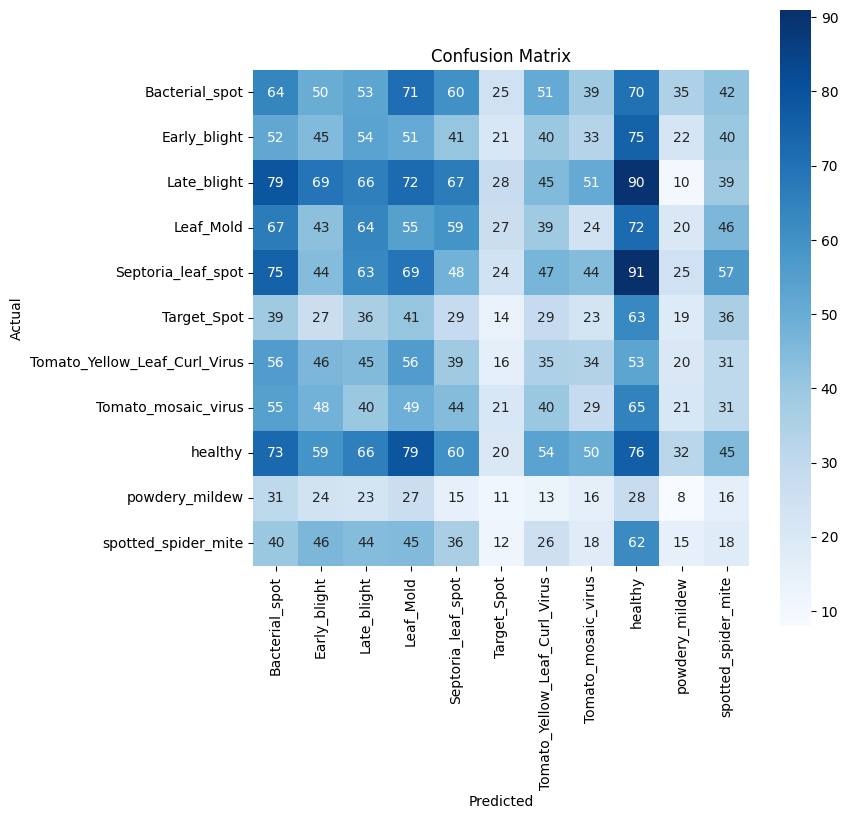

In [144]:
from sklearn.metrics import confusion_matrix
import numpy as np

# Get predictions for the test data
y_pred = model.predict(test_generator)
y_pred_classes = np.argmax(y_pred, axis=1)

# Get true labels for the test data
true_classes = test_generator.classes

# Compute confusion matrix
conf_matrix = confusion_matrix(true_classes, y_pred_classes)

# Plot confusion matrix
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', square=True,
            xticklabels=test_generator.class_indices.keys(), yticklabels=test_generator.class_indices.keys())
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

In [145]:
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score


In [146]:
precision = precision_score(true_classes, y_pred_classes, average='weighted')
recall = recall_score(true_classes, y_pred_classes, average='weighted')
f1 = f1_score(true_classes, y_pred_classes, average='weighted')
accuracy = accuracy_score(true_classes, y_pred_classes)

# Print metrics
print(f"Precision: {precision}")
print(f"Recall (Sensitivity): {recall}")
print(f"F1 Score: {f1}")
print(f"Accuracy: {accuracy}")

Precision: 0.08822068027532277
Recall (Sensitivity): 0.08857087603945078
F1 Score: 0.08776389667273421
Accuracy: 0.08857087603945078


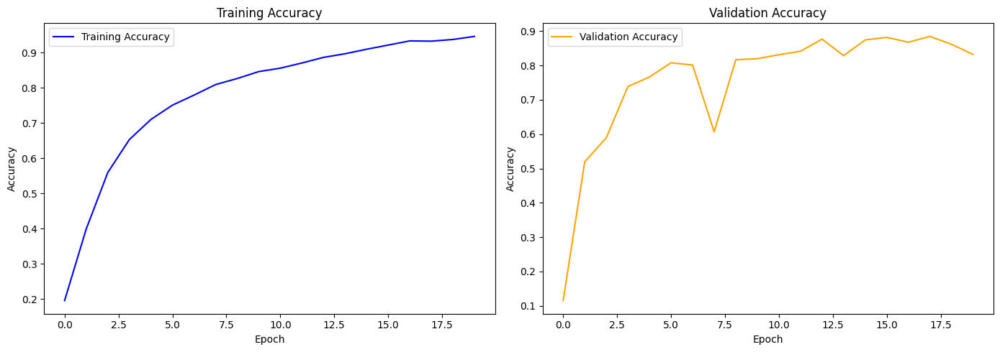

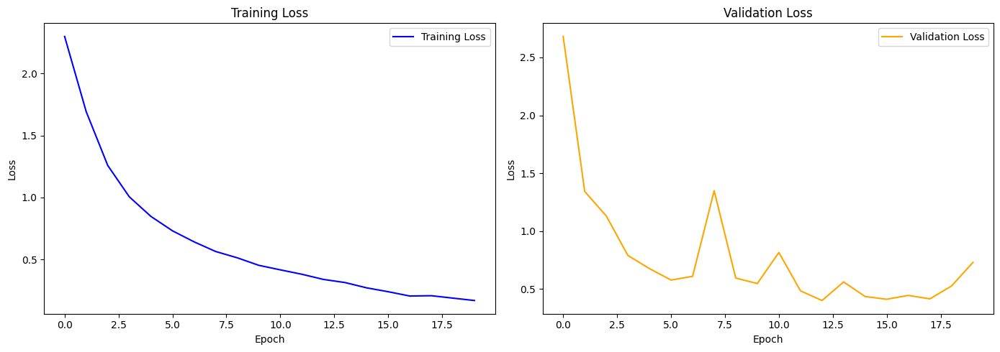

In [147]:
import matplotlib.pyplot as plt
train_accuracy = history1.history['accuracy']
val_accuracy = history1.history['val_accuracy']
train_loss = history1.history['loss']
val_loss = history1.history['val_loss']
plt.figure(figsize=(14, 5))
plt.subplot(1, 2, 1)
plt.plot(train_accuracy, label='Training Accuracy', color='blue')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training Accuracy')
plt.legend()


# Plot validation accuracy
plt.subplot(1, 2, 2)
plt.plot(val_accuracy, label='Validation Accuracy', color='orange')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Validation Accuracy')
plt.legend()

plt.tight_layout()
plt.show()


# Plot training and validation loss
plt.figure(figsize=(14, 5))

# Plot training loss
plt.subplot(1, 2, 1)
plt.plot(train_loss, label='Training Loss', color='blue')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss')
plt.legend()

# Plot validation loss
plt.subplot(1, 2, 2)
plt.plot(val_loss, label='Validation Loss', color='orange')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Validation Loss')
plt.legend()

plt.tight_layout()
plt.show()

In [148]:
# Compute overall accuracy
accuracy = accuracy_score(true_classes, y_pred_classes)
print(f"Overall Accuracy: {accuracy}")

# Compute class-wise metrics
precision = precision_score(true_classes, y_pred_classes, average=None)
recall = recall_score(true_classes, y_pred_classes, average=None)
f1 = f1_score(true_classes, y_pred_classes, average=None)

# Get class labels from the generator
class_labels = list(test_generator.class_indices.keys())

# Create a DataFrame to display the results in a table format
metrics_df_EffNet = pd.DataFrame({
    'Class': class_labels,
    'Precision': precision,
    'Recall (Sensitivity)': recall,
    'F1 Score': f1
})


Overall Accuracy: 0.08857087603945078


In [149]:
metrics_df_EffNet

,Class,Precision,Recall (Sensitivity),F1 Score
0,Bacterial_spot,0.101426,0.114286,0.107473
1,Early_blight,0.089820,0.094937,0.092308
2,Late_blight,0.119134,0.107143,0.112821
3,Leaf_Mold,0.089431,0.106589,0.097259
4,Septoria_leaf_spot,0.096386,0.081772,0.088479
5,Target_Spot,0.063927,0.039326,0.048696
6,Tomato_Yellow_Leaf_Curl_Virus,0.083532,0.081206,0.082353
7,Tomato_mosaic_virus,0.080332,0.065463,0.072139
8,healthy,0.102013,0.123779,0.111847
9,powdery_mildew,0.035242,0.037736,0.036446


In [150]:
metrics_df_EffNet.to_csv('EFNET_individual_class_metrics.csv')

In [151]:
model.save('Tomato.h5')

In [152]:
from tensorflow.keras.models import load_model

In [153]:
tomato_model=load_model('Tomato.h5')

In [165]:
img_path='/Users/sonu/Downloads/archive (1)/train/Septoria_leaf_spot/0a5edec2-e297-4a25-86fc-78f03772c100___JR_Sept.L.S 8468_180deg.JPG'

In [166]:
from tensorflow.keras.preprocessing import image
import numpy as np

# Define the target image size
IMG_SIZE = 256

def preprocess_single_image(img_path):
    # Load the image with the target size
    img = image.load_img(img_path, target_size=(IMG_SIZE, IMG_SIZE))
    
    # Convert the image to a NumPy array
    img_array = image.img_to_array(img)
    
    # Normalize pixel values to [0, 1] range
    img_array /= 255.0
    
    # Expand dimensions to match the model's expected input shape
    img_array = np.expand_dims(img_array, axis=0)
    
    return img_array

# Example: Preprocess an image and predict using the model
img_data = preprocess_single_image(img_path)

# Make predictions with the model
predictions = tomato_model.predict(img_data)

# Get the predicted class index
predicted_class = np.argmax(predictions, axis=-1)

# Assuming class labels from your dataset
class_labels = ['Bacterial Spot', 'Early Blight', 'Late Blight','Leaf Mold','Septoria Leaf Spot','Target Spot','Tomato Yellow Leaf Curl Virus','Tomato Mosaic Virus','Healthy','Powdery_Mildew','Spotted Spider Mite' ]  # Replace with actual class labels
predicted_class_name = class_labels[predicted_class[0]]

print(f"Predicted class index: {predicted_class[0]}")
print(f"Predicted class name: {predicted_class_name}")


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
Predicted class index: 4
Predicted class name: Septoria Leaf Spot


In [54]:
tomato_model.save_weights('tomato_model.weights.h5')